In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import folium
from folium.plugins import MousePosition
from folium.features import DivIcon
import math
import plotly.express as px

df=pd.read_csv('./dataset_part_1.csv')
df.head(10)


,FlightNumber,Date,BoosterVersion,PayloadMass,Orbit,LaunchSite,Outcome,Flights,GridFins,Reused,Legs,LandingPad,Block,ReusedCount,Serial,Longitude,Latitude
0,1,2010-06-04,Falcon 9,6123.547647,LEO,CCSFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B0003,-80.577366,28.561857
1,2,2012-05-22,Falcon 9,525.000000,LEO,CCSFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B0005,-80.577366,28.561857
2,3,2013-03-01,Falcon 9,677.000000,ISS,CCSFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B0007,-80.577366,28.561857
3,4,2013-09-29,Falcon 9,500.000000,PO,VAFB SLC 4E,False Ocean,1,False,False,False,NaN,1.0,0,B1003,-120.610829,34.632093
4,5,2013-12-03,Falcon 9,3170.000000,GTO,CCSFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B1004,-80.577366,28.561857
5,6,2014-01-06,Falcon 9,3325.000000,GTO,CCSFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B1005,-80.577366,28.561857
6,7,2014-04-18,Falcon 9,2296.000000,ISS,CCSFS SLC 40,True Ocean,1,False,False,True,NaN,1.0,0,B1006,-80.577366,28.561857
7,8,2014-07-14,Falcon 9,1316.000000,LEO,CCSFS SLC 40,True Ocean,1,False,False,True,NaN,1.0,0,B1007,-80.577366,28.561857
8,9,2014-08-05,Falcon 9,4535.000000,GTO,CCSFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B1008,-80.577366,28.561857
9,10,2014-09-07,Falcon 9,4428.000000,GTO,CCSFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B1011,-80.577366,28.561857


In [3]:
print(df.columns)

Index(['FlightNumber', 'Date', 'BoosterVersion', 'PayloadMass', 'Orbit',
       'LaunchSite', 'Outcome', 'Flights', 'GridFins', 'Reused', 'Legs',
       'LandingPad', 'Block', 'ReusedCount', 'Serial', 'Longitude',
       'Latitude'],
      dtype='object')


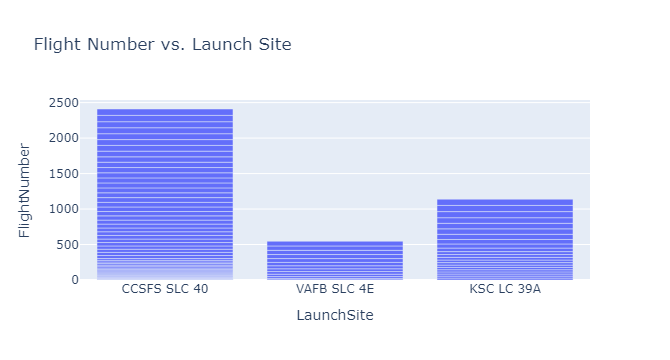

In [4]:
# Create a bar chart
fig = px.bar(df, x='LaunchSite', y='FlightNumber', title='Flight Number vs. Launch Site')
fig.show()

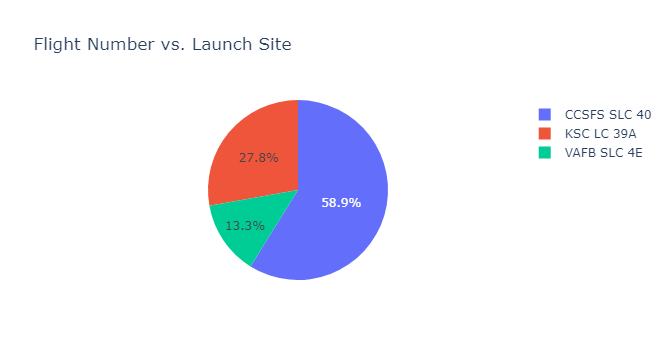

In [10]:


fig = px.pie(df,values='FlightNumber', names ='LaunchSite', title='Flight Number vs. Launch Site')
fig.show()

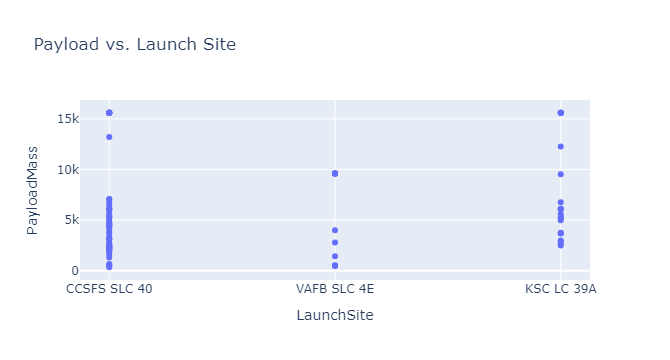

In [11]:
# Create a scatter plot
fig = px.scatter(df, x='LaunchSite', y='PayloadMass', title='Payload vs. Launch Site')
fig.show()

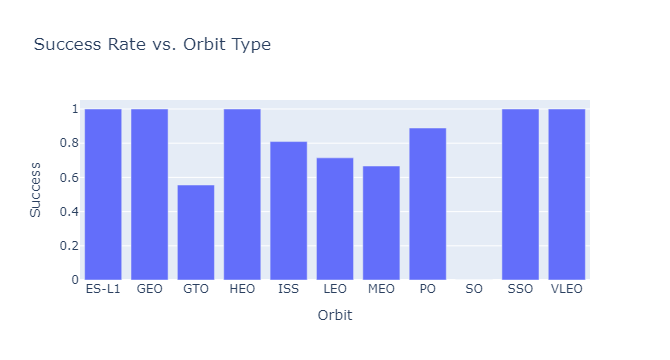

In [13]:
# Calculate success rate by orbit type
df['Success'] = df['Outcome'].apply(lambda x: 1 if 'None' not in x else 0)
success_rate = df.groupby('Orbit')['Success'].mean().reset_index()

# Create a bar chart
fig = px.bar(success_rate, x='Orbit', y='Success', title='Success Rate vs. Orbit Type')
fig.show()

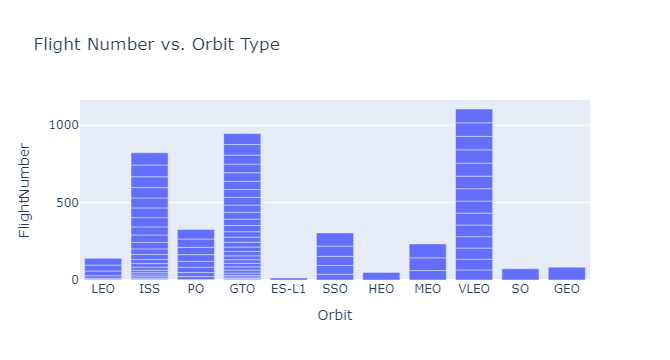

In [16]:
# Create a bar chart
fig = px.bar(df, x='Orbit', y='FlightNumber', title='Flight Number vs. Orbit Type')
fig.show()

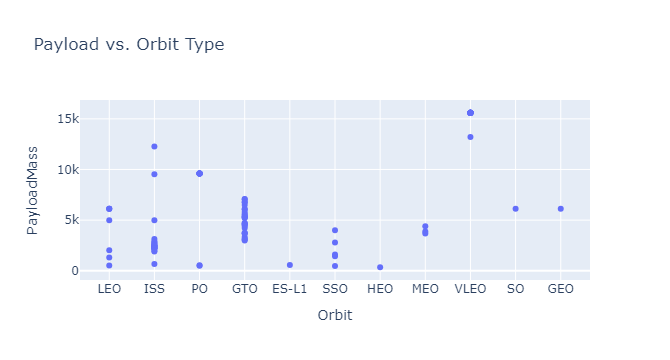

In [14]:
# Create a scatter plot
fig = px.scatter(df, x='Orbit', y='PayloadMass', title='Payload vs. Orbit Type')
fig.show()

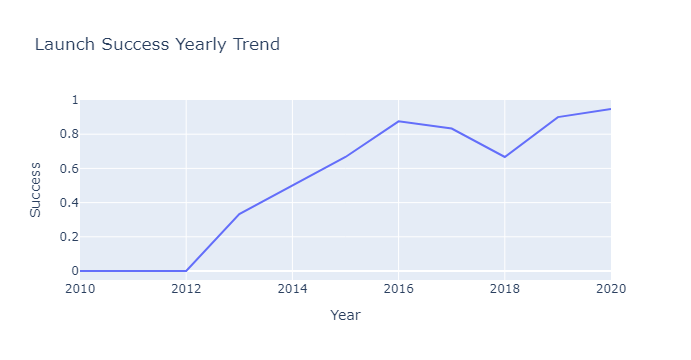

In [17]:
df['Year'] = pd.to_datetime(df['Date']).dt.year
success_trend = df.groupby('Year')['Success'].mean().reset_index()
fig = px.line(success_trend, x='Year', y='Success', title='Launch Success Yearly Trend')
fig.show()


In [73]:
import pandas


In [74]:
# Get unique launch site names
launch_sites = df['Launch_Site'].unique()
print("All Launch Site Names:\n", launch_sites)

All Launch Site Names:
 ['CCAFS LC-40' 'VAFB SLC-4E' 'KSC LC-39A' 'CCAFS SLC-40']


#### ED with SQL

In [75]:
!pip install sqlalchemy==1.3.9

  Using cached SQLAlchemy-1.3.9-cp311-cp311-linux_x86_64.whl
  Attempting uninstall: sqlalchemy
    Found existing installation: SQLAlchemy 2.0.32
    Uninstalling SQLAlchemy-2.0.32:
      Successfully uninstalled SQLAlchemy-2.0.32
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython-sql 0.5.0 requires sqlalchemy>=2.0, but you have sqlalchemy 1.3.9 which is incompatible.


In [76]:
!pip install ipython-sql

  Using cached SQLAlchemy-2.0.32-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (3.2 MB)
  Attempting uninstall: sqlalchemy
    Found existing installation: SQLAlchemy 1.3.9
    Uninstalling SQLAlchemy-1.3.9:
      Successfully uninstalled SQLAlchemy-1.3.9


In [77]:
%load_ext sql

The sql extension is already loaded. To reload it, use:
  %reload_ext sql


In [1]:
import csv, sqlite3

con = sqlite3.connect("my_data1.db")
cur = con.cursor()

In [2]:
!pip install -q pandas

In [4]:
%load_ext sql

In [5]:
%sql sqlite:///my_data1.db

In [6]:
import pandas as pd
df = pd.read_csv("https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-DS0321EN-SkillsNetwork/labs/module_2/data/Spacex.csv")
df.to_sql("SPACEXTBL", con, if_exists='replace', index=False,method="multi")

101

In [7]:
%sql DROP TABLE IF EXISTS SPACEXTABLE;

 * sqlite:///my_data1.db
Done.


[]

In [8]:
%sql create table SPACEXTABLE as select * from SPACEXTBL where Date is not null

 * sqlite:///my_data1.db
Done.


[]

In [9]:
%sql SELECT * FROM  SPACEXTABLE LIMIT 1;


 * sqlite:///my_data1.db
Done.


Date,Time (UTC),Booster_Version,Launch_Site,Payload,PAYLOAD_MASS__KG_,Orbit,Customer,Mission_Outcome,Landing_Outcome
2010-06-04,18:45:00,F9 v1.0 B0003,CCAFS LC-40,Dragon Spacecraft Qualification Unit,0,LEO,SpaceX,Success,Failure (parachute)


#### Display the names of the unique launch sites in the space mission

In [10]:
%sql SELECT DISTINCT Launch_Site FROM SPACEXTABLE;

 * sqlite:///my_data1.db
Done.


Launch_Site
CCAFS LC-40
VAFB SLC-4E
KSC LC-39A
CCAFS SLC-40


#### Display 5 records where launch sites begin with the string 'CCA'

In [90]:
%sql SELECT * FROM SPACEXTABLE WHERE Launch_Site LIKE 'CCA%' LIMIT 5;


 * sqlite:///my_data1.db
Done.


Date,Time (UTC),Booster_Version,Launch_Site,Payload,PAYLOAD_MASS__KG_,Orbit,Customer,Mission_Outcome,Landing_Outcome
2010-06-04,18:45:00,F9 v1.0 B0003,CCAFS LC-40,Dragon Spacecraft Qualification Unit,0,LEO,SpaceX,Success,Failure (parachute)
2010-12-08,15:43:00,F9 v1.0 B0004,CCAFS LC-40,"Dragon demo flight C1, two CubeSats, barrel of Brouere cheese",0,LEO (ISS),NASA (COTS) NRO,Success,Failure (parachute)
2012-05-22,7:44:00,F9 v1.0 B0005,CCAFS LC-40,Dragon demo flight C2,525,LEO (ISS),NASA (COTS),Success,No attempt
2012-10-08,0:35:00,F9 v1.0 B0006,CCAFS LC-40,SpaceX CRS-1,500,LEO (ISS),NASA (CRS),Success,No attempt
2013-03-01,15:10:00,F9 v1.0 B0007,CCAFS LC-40,SpaceX CRS-2,677,LEO (ISS),NASA (CRS),Success,No attempt


#### Display the total payload mass carried by boosters launched by NASA (CRS)

In [93]:
%%sql SELECT SUM(PAYLOAD_MASS__KG_) AS TotalPayloadMass
     FROM SPACEXTABLE
     WHERE Customer = 'NASA (CRS)' AND PAYLOAD_MASS__KG_ IS NOT NULL;



 * sqlite:///my_data1.db
Done.


TotalPayloadMass
45596


#### Display average payload mass carried by booster version F9 v1.1

In [27]:
%%sql SELECT AVG(PAYLOAD_MASS__KG_) AS AvgPayloadMass
     FROM SPACEXTABLE
     WHERE Booster_Version = 'F9 v1.1' AND PAYLOAD_MASS__KG_ IS NOT NULL;


 * sqlite:///my_data1.db
Done.


AvgPayloadMass
2928.4


#### List of date when the first succesful landing outcome in ground pad was acheived.

In [28]:
%%sql SELECT MIN(Date) AS FirstSuccessfulGroundLanding
     FROM SPACEXTABLE
     WHERE Landing_Outcome LIKE 'Success (ground pad)';


 * sqlite:///my_data1.db
Done.


FirstSuccessfulGroundLanding
2015-12-22


#### List of names of the boosters which have success in drone ship and have payload mass greater than 4000 but less than 6000

In [29]:
%%sql SELECT DISTINCT Booster_Version
     FROM SPACEXTABLE
     WHERE Landing_Outcome LIKE 'Success (drone ship)' AND PAYLOAD_MASS__KG_ BETWEEN 4000 AND 6000;


 * sqlite:///my_data1.db
Done.


Booster_Version
F9 FT B1022
F9 FT B1026
F9 FT B1021.2
F9 FT B1031.2


####  List of Total Number of Successful and Failure Mission Outcomes

In [30]:
%%sql SELECT Mission_Outcome, COUNT(*) AS TotalMissions
     FROM SPACEXTABLE
     GROUP BY Mission_Outcome;


 * sqlite:///my_data1.db
Done.


Mission_Outcome,TotalMissions
Failure (in flight),1
Success,98
Success,1
Success (payload status unclear),1


#### List the Names of the Booster Versions Which Have Carried the Maximum Payload Mass

In [95]:
import pandas as pd

# Find the maximum payload mass
max_payload_mass = df['PAYLOAD_MASS__KG_'].max()

# Filter the DataFrame to get the booster versions with the maximum payload mass
booster_versions = df[df['PAYLOAD_MASS__KG_'] == max_payload_mass]['Booster_Version']

# Display the result
print(booster_versions)

74     F9 B5 B1048.4
77     F9 B5 B1049.4
79     F9 B5 B1051.3
80     F9 B5 B1056.4
82     F9 B5 B1048.5
83     F9 B5 B1051.4
85     F9 B5 B1049.5
92    F9 B5 B1060.2 
93    F9 B5 B1058.3 
94     F9 B5 B1051.6
95     F9 B5 B1060.3
99    F9 B5 B1049.7 
Name: Booster_Version, dtype: object


In [31]:
%%sql SELECT Booster_Version
     FROM SPACEXTABLE
     WHERE PAYLOAD_MASS__KG_ = (SELECT MAX(PAYLOAD_MASS__KG_) FROM SPACEXTABLE);


 * sqlite:///my_data1.db
Done.


Booster_Version
F9 B5 B1048.4
F9 B5 B1049.4
F9 B5 B1051.3
F9 B5 B1056.4
F9 B5 B1048.5
F9 B5 B1051.4
F9 B5 B1049.5
F9 B5 B1060.2
F9 B5 B1058.3
F9 B5 B1051.6


####  List of Records Displaying Month Names, Failure Landing Outcomes in Drone Ship, Booster Versions, and Launch Site for the Months in 2015

In [32]:
%%sql SELECT strftime('%m', Date) AS Month,
             COUNT(CASE WHEN Landing_Outcome LIKE 'Failure (drone ship)' THEN 1 END) AS FailureCount,
             Booster_Version,
             Launch_Site
     FROM SPACEXTABLE
     WHERE strftime('%Y', Date) = '2015'
     GROUP BY Month, Booster_Version, Launch_Site;


 * sqlite:///my_data1.db
Done.


Month,FailureCount,Booster_Version,Launch_Site
01,1,F9 v1.1 B1012,CCAFS LC-40
02,0,F9 v1.1 B1013,CCAFS LC-40
03,0,F9 v1.1 B1014,CCAFS LC-40
04,1,F9 v1.1 B1015,CCAFS LC-40
04,0,F9 v1.1 B1016,CCAFS LC-40
06,0,F9 v1.1 B1018,CCAFS LC-40
12,0,F9 FT B1019,CCAFS LC-40


#### Rank the Count of Landing Outcomes (Such as Failure (drone ship) or Success (ground pad)) Between the Dates 2010-06-04 and 2017-03-20

In [33]:
%%sql SELECT Landing_Outcome, COUNT(*) AS OutcomeCount
     FROM SPACEXTABLE
     WHERE Date BETWEEN '2010-06-04' AND '2017-03-20'
     GROUP BY Landing_Outcome
     ORDER BY OutcomeCount DESC;


 * sqlite:///my_data1.db
Done.


Landing_Outcome,OutcomeCount
No attempt,10
Success (drone ship),5
Failure (drone ship),5
Success (ground pad),3
Controlled (ocean),3
Uncontrolled (ocean),2
Failure (parachute),2
Precluded (drone ship),1


In [11]:
# Pandas is a software library written for the Python programming language for data manipulation and analysis.
import pandas as pd
# NumPy is a library for the Python programming language, adding support for large, multi-dimensional arrays and matrices, along with a large collection of high-level mathematical functions to operate on these arrays
import numpy as np
# Matplotlib is a plotting library for python and pyplot gives us a MatLab like plotting framework. We will use this in our plotter function to plot data.
import matplotlib.pyplot as plt
#Seaborn is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics
import seaborn as sns
# Preprocessing allows us to standarsize our data
from sklearn import preprocessing
# Allows us to split our data into training and testing data
from sklearn.model_selection import train_test_split
# Allows us to test parameters of classification algorithms and find the best one
from sklearn.model_selection import GridSearchCV
# Logistic Regression classification algorithm
from sklearn.linear_model import LogisticRegression
# Support Vector Machine classification algorithm
from sklearn.svm import SVC
# Decision Tree classification algorithm
from sklearn.tree import DecisionTreeClassifier
# K Nearest Neighbors classification algorithm
from sklearn.neighbors import KNeighborsClassifier

In [12]:
data = pd.read_csv('./dataset_part_2.csv')

In [13]:
X = pd.read_csv('./dataset_part_3.csv')

In [14]:
data.head()

,FlightNumber,Date,BoosterVersion,PayloadMass,Orbit,LaunchSite,Outcome,Flights,GridFins,Reused,Legs,LandingPad,Block,ReusedCount,Serial,Longitude,Latitude,Class
0,1,2010-06-04,Falcon 9,6104.959412,LEO,CCAFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B0003,-80.577366,28.561857,0
1,2,2012-05-22,Falcon 9,525.000000,LEO,CCAFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B0005,-80.577366,28.561857,0
2,3,2013-03-01,Falcon 9,677.000000,ISS,CCAFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B0007,-80.577366,28.561857,0
3,4,2013-09-29,Falcon 9,500.000000,PO,VAFB SLC 4E,False Ocean,1,False,False,False,NaN,1.0,0,B1003,-120.610829,34.632093,0
4,5,2013-12-03,Falcon 9,3170.000000,GTO,CCAFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B1004,-80.577366,28.561857,0


In [15]:
X.head()

,FlightNumber,PayloadMass,Flights,Block,ReusedCount,Orbit_ES-L1,Orbit_GEO,Orbit_GTO,Orbit_HEO,Orbit_ISS,...,Serial_B1058,Serial_B1059,Serial_B1060,Serial_B1062,GridFins_False,GridFins_True,Reused_False,Reused_True,Legs_False,Legs_True
0,1.0,6104.959412,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
1,2.0,525.000000,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
2,3.0,677.000000,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
3,4.0,500.000000,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
4,5.0,3170.000000,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0


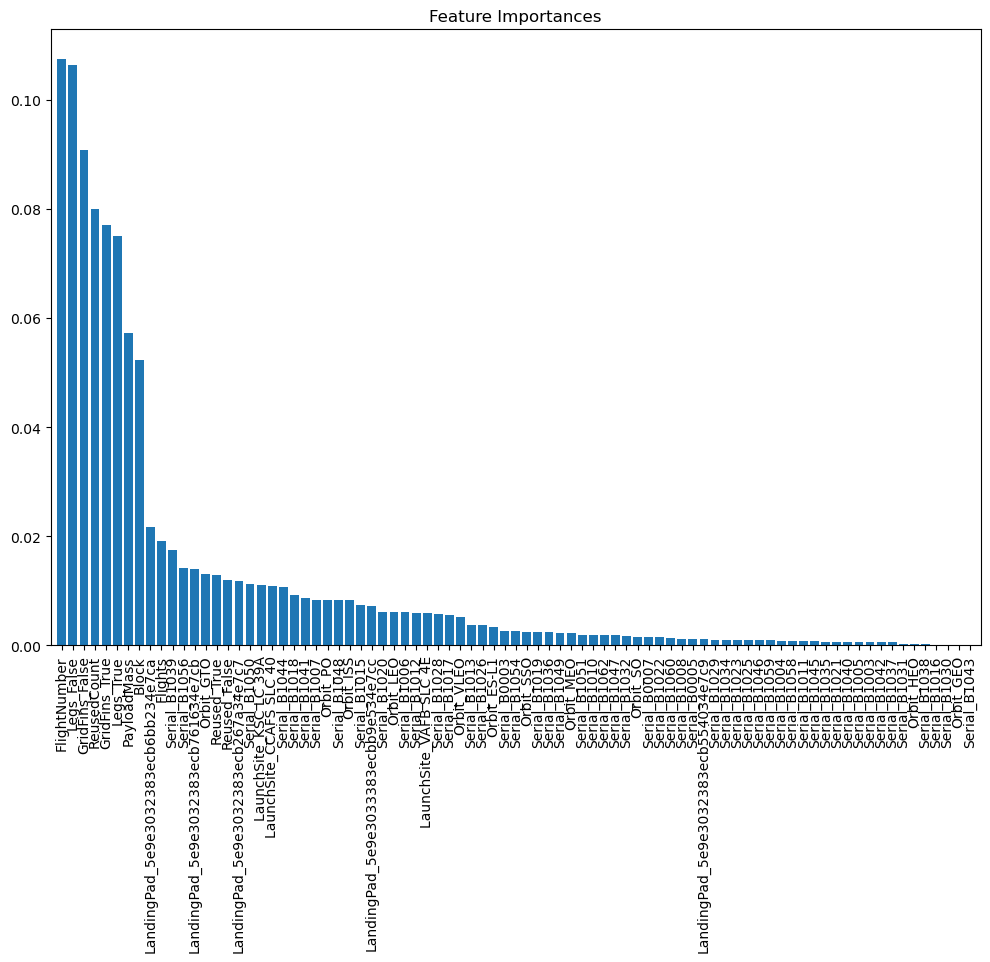

In [16]:
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt

# Train a RandomForest model
model = RandomForestClassifier()
model.fit(X, data['Class'])

# Get feature importances
importances = model.feature_importances_
features = X.columns
indices = importances.argsort()[::-1]

# Plot feature importances
plt.figure(figsize=(12, 8))
plt.title('Feature Importances')
plt.bar(range(X.shape[1]), importances[indices], align='center')
plt.xticks(range(X.shape[1]), features[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()

#### Folium

In [17]:
import pandas as pd
import folium
# Load the dataset
data = pd.read_csv('./dataset_part_2.csv')

# Display the first few rows to understand its structure
print(data.head())


   FlightNumber        Date BoosterVersion  PayloadMass Orbit    LaunchSite  \
0             1  2010-06-04       Falcon 9  6104.959412   LEO  CCAFS SLC 40   
1             2  2012-05-22       Falcon 9   525.000000   LEO  CCAFS SLC 40   
2             3  2013-03-01       Falcon 9   677.000000   ISS  CCAFS SLC 40   
3             4  2013-09-29       Falcon 9   500.000000    PO   VAFB SLC 4E   
4             5  2013-12-03       Falcon 9  3170.000000   GTO  CCAFS SLC 40   

       Outcome  Flights  GridFins  Reused   Legs LandingPad  Block  \
0    None None        1     False   False  False        NaN    1.0   
1    None None        1     False   False  False        NaN    1.0   
2    None None        1     False   False  False        NaN    1.0   
3  False Ocean        1     False   False  False        NaN    1.0   
4    None None        1     False   False  False        NaN    1.0   

   ReusedCount Serial   Longitude   Latitude  Class  
0            0  B0003  -80.577366  28.561857      

In [18]:
# Extract launch site coordinates
launch_sites = data[['LaunchSite', 'Longitude', 'Latitude']].drop_duplicates()

# Display the coordinates
print(launch_sites)


      LaunchSite   Longitude   Latitude
0   CCAFS SLC 40  -80.577366  28.561857
3    VAFB SLC 4E -120.610829  34.632093
26    KSC LC 39A  -80.603956  28.608058


#### Define Launch Sites Coordinates

In [19]:
# Define the launch sites data
launch_sites = pd.DataFrame({
    'LaunchSite': ['CCAFS SLC 40', 'VAFB SLC 4E', 'KSC LC 39A'],
    'Longitude': [-80.577366, -120.610829, -80.603956],
    'Latitude': [28.561857, 34.632093, 28.608058]
})


####  Create a Folium Map

In [20]:
#### # Calculate the center of the map
map_center = [launch_sites['Latitude'].mean(), launch_sites['Longitude'].mean()]

# Create a Folium map object
folium_map = folium.Map(location=map_center, zoom_start=5)


#### Add Markers for Each Launch Site

In [21]:
# Add markers for each launch site
for index, row in launch_sites.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['LaunchSite'],
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(folium_map)

# Save or display the map
folium_map.save('launch_sites_map.html')
folium_map

In [22]:
import folium

# Define the coordinates for the launch sites with colors and sizes
coordinates = [
    {'name': 'CCAFS SLC 40', 'lat': 28.561857, 'lon': -80.577366, 'color': 'blue', 'radius': 15},
    {'name': 'VAFB SLC 4E', 'lat': 34.632093, 'lon': -120.610829, 'color': 'red', 'radius': 20},
    {'name': 'KSC LC 39A', 'lat': 28.608058, 'lon': -80.603956, 'color': 'green', 'radius': 25}
]

# Create a Folium map centered around the average location
folium_map = folium.Map(location=[(28.561857 + 34.632093) / 2, (-80.577366 - 120.610829) / 2], zoom_start=5)

# Add circle markers for each coordinate with different colors and sizes
for coord in coordinates:
    folium.CircleMarker(
        location=[coord['lat'], coord['lon']],
        radius=coord['radius'],  # Radius of the circle in pixels
        color=coord['color'],  # Border color of the circle
        fill=True,  # Fill the circle with color
        fill_color='white',  # Fill color of the circle (white)
        fill_opacity=0.6,  # Opacity of the fill color
        popup=coord['name']  # Popup with site name
    ).add_to(folium_map)

# Save or display the map
folium_map.save('launch_sites_map.html')



folium_map


In [23]:
world_geo = r'https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DV0101EN-SkillsNetwork/Data%20Files/world_countries.json' # geojson file

# create a plain world map
world_map = folium.Map(location=[0, 0], zoom_start=2)

In [24]:
# Import folium MarkerCluster plugin
from folium.plugins import MarkerCluster
# Import folium MousePosition plugin
from folium.plugins import MousePosition
# Import folium DivIcon plugin
from folium.features import DivIcon

In [25]:
spacex_df=pd.read_csv('./spacex_launch_geo.csv')

In [26]:
# Select relevant sub-columns: `Launch Site`, `Lat(Latitude)`, `Long(Longitude)`, `class`
spacex_df = spacex_df[['Launch Site', 'Lat', 'Long', 'class']]
launch_sites_df = spacex_df.groupby(['Launch Site'], as_index=False).first()
launch_sites_df = launch_sites_df[['Launch Site', 'Lat', 'Long']]
launch_sites_df

,Launch Site,Lat,Long
0,CCAFS LC-40,28.562302,-80.577356
1,CCAFS SLC-40,28.563197,-80.576820
2,KSC LC-39A,28.573255,-80.646895
3,VAFB SLC-4E,34.632834,-120.610745


In [27]:
# Start location is NASA Johnson Space Center
nasa_coordinate = [29.559684888503615, -95.0830971930759]
site_map = folium.Map(location=nasa_coordinate, zoom_start=10)

In [28]:
# Create a blue circle at NASA Johnson Space Center's coordinate with a popup label showing its name
circle = folium.Circle(nasa_coordinate, radius=1000, color='#d35400', fill=True).add_child(folium.Popup('NASA Johnson Space Center'))
# Create a blue circle at NASA Johnson Space Center's coordinate with a icon showing its name
marker = folium.map.Marker(
    nasa_coordinate,
    # Create an icon as a text label
    icon=DivIcon(
        icon_size=(20,20),
        icon_anchor=(0,0),
        html='<div style="font-size: 12; color:#d35400;"><b>%s</b></div>' % 'NASA JSC',
        )
    )
site_map.add_child(circle)
site_map.add_child(marker)

In [29]:
import folium
from folium import DivIcon

# Initialize the map centered around NASA Johnson Space Center
nasa_coordinate = [29.559684888503615, -95.0830971930759]
site_map = folium.Map(location=nasa_coordinate, zoom_start=10)

# Data for launch sites
launch_sites_df = pd.DataFrame({
    'Launch Site': ['CCAFS LC-40', 'CCAFS SLC-40', 'KSC LC-39A', 'VAFB SLC-4E'],
    'Lat': [28.562302, 28.563197, 28.573255, 34.632834],
    'Long': [-80.577356, -80.576820, -80.646895, -120.610745]
})

# Add a circle and marker for each launch site
for _, site in launch_sites_df.iterrows():
    coordinate = [site['Lat'], site['Long']]
    
    # Add circle
    folium.Circle(
        location=coordinate,
        radius=2000,  # Increase radius for better visibility
        color='blue',
        fill=True,
        fill_color='white',
        fill_opacity=0.6
    ).add_to(site_map)
    
    # Add marker
    folium.Marker(
        location=coordinate,
        icon=DivIcon(
            icon_size=(20,20),
            icon_anchor=(0,0),
            html='<div style="font-size: 12pt; color:#d35400;"><b>%s</b></div>' % site['Launch Site']
        )
    ).add_to(site_map)

# Save map to an HTML file
site_map.save('launch_sites_map.html')
site_map

In [30]:
import folium
from folium import DivIcon

# Initialize the map centered around NASA Johnson Space Center
nasa_coordinate = [29.559684888503615, -95.0830971930759]
site_map = folium.Map(location=nasa_coordinate, zoom_start=10)

# Load the dataset including outcome information
spacex_df = pd.read_csv('./spacex_launch_geo.csv')
spacex_df = spacex_df[['Launch Site', 'Lat', 'Long', 'class']]

# Add circles and markers for each launch site with color-coded outcomes
for _, site in spacex_df.iterrows():
    coordinate = [site['Lat'], site['Long']]
    
    # Determine color based on outcome
    outcome_color = 'green' if site['class'] == 1 else 'red'
    
    # Add circle
    folium.Circle(
        location=coordinate,
        radius=2000,
        color=outcome_color,
        fill=True,
        fill_color=outcome_color,
        fill_opacity=0.6
    ).add_to(site_map)
    
    # Add marker
    folium.Marker(
        location=coordinate,
        icon=DivIcon(
            icon_size=(20,20),
            icon_anchor=(0,0),
            html='<div style="font-size: 12pt; color:#d35400;"><b>%s</b></div>' % site['Launch Site']
        )
    ).add_to(site_map)

# Save map to an HTML file
site_map.save('launch_sites_outcomes_map.html')
site_map

In [31]:
import folium
from folium import DivIcon

# Define the launch site of interest
selected_site = 'KSC LC-39A'
site_info = spacex_df[spacex_df['Launch Site'] == selected_site].iloc[0]
coordinate = [site_info['Lat'], site_info['Long']]

# Initialize the map centered on the selected launch site
site_map = folium.Map(location=coordinate, zoom_start=12)

# Add a circle for the selected launch site
folium.Circle(
    location=coordinate,
    radius=2000,
    color='blue',
    fill=True,
    fill_color='white',
    fill_opacity=0.6
).add_to(site_map)

# Add a marker for the selected launch site
folium.Marker(
    location=coordinate,
    icon=DivIcon(
        icon_size=(20,20),
        icon_anchor=(0,0),
        html='<div style="font-size: 12pt; color:#d35400;"><b>%s</b></div>' % selected_site
    )
).add_to(site_map)

# Example of adding proximity markers (e.g., railways, highways, coastlines)
# Placeholder for actual data; adjust coordinates as needed
proximity_features = {
    'Railway': [28.575, -80.650],
    'Highway': [28.570, -80.640],
    'Coastline': [28.560, -80.620]
}

for feature, location in proximity_features.items():
    folium.Marker(
        location=location,
        popup=feature,
        icon=folium.Icon(color='red')
    ).add_to(site_map)

# Save map to an HTML file
site_map.save('selected_launch_site_proximities.html')
site_map

In [32]:
import folium
from folium import DivIcon
import pandas as pd

# Load the dataset with launch sites' information
spacex_df = pd.read_csv('./spacex_launch_geo.csv')
spacex_df = spacex_df[['Launch Site', 'Lat', 'Long', 'class']]

# Initial the map, centered around NASA Johnson Space Center
nasa_coordinate = [29.559684888503615, -95.0830971930759]
site_map = folium.Map(location=nasa_coordinate, zoom_start=5)

# Loop through each launch site and add Circle and Marker to the map
for _, site in spacex_df.iterrows():
    coordinate = [site['Lat'], site['Long']]
    launch_site_name = site['Launch Site']
    
    # Add a circle for the launch site
    folium.Circle(
        location=coordinate,
        radius=2000,  # Adjust radius as needed
        color='blue',  # Color of the circle border
        fill=True,
        fill_color='blue',  # Fill color of the circle
        fill_opacity=0.5  # Opacity of the circle fill
    ).add_to(site_map)
    
    # Add a marker with a popup label for the launch site
    folium.Marker(
        location=coordinate,
        icon=DivIcon(
            icon_size=(20,20),
            icon_anchor=(0,0),
            html='<div style="font-size: 12pt; color:#d35400;"><b>%s</b></div>' % launch_site_name
        ),
        popup=launch_site_name
    ).add_to(site_map)

# Save the map to an HTML file
site_map.save('launch_sites_map.html')
site_map

In [33]:
import folium
from folium import DivIcon
import pandas as pd

# Load the dataset with launch sites' information
spacex_df = pd.read_csv('./spacex_launch_geo.csv')
spacex_df = spacex_df[['Launch Site', 'Lat', 'Long', 'class']]

# Initialize the map, centered around NASA Johnson Space Center
nasa_coordinate = [29.559684888503615, -95.0830971930759]
site_map = folium.Map(location=nasa_coordinate, zoom_start=5)

# Loop through each launch site and add Circle and Marker to the map
for _, site in spacex_df.iterrows():
    coordinate = [site['Lat'], site['Long']]
    launch_site_name = site['Launch Site']
    
    # Add a circle for the launch site
    folium.Circle(
        location=coordinate,
        radius=2000,  # Adjust radius as needed
        color='blue',  # Color of the circle border
        fill=True,
        fill_color='blue',  # Fill color of the circle
        fill_opacity=0.2  # Opacity of the circle fill
    ).add_to(site_map)
    
    # Add a marker with a popup label for the launch site
    folium.Marker(
        location=coordinate,
        icon=DivIcon(
            icon_size=(150,40),
            icon_anchor=(0,0),
            html='<div style="font-size: 16pt; color:#d35400; font-weight: bold; text-align: center;">%s</div>' % launch_site_name
        ),
        popup=launch_site_name
    ).add_to(site_map)

# Save the map to an HTML file
site_map.save('launch_sites_map.html')
site_map

In [34]:
import folium
from folium import DivIcon
import pandas as pd

# Load the dataset with launch sites' information
spacex_df = pd.read_csv('./spacex_launch_geo.csv')
spacex_df = spacex_df[['Launch Site', 'Lat', 'Long', 'class']]

# Initialize the map, centered around NASA Johnson Space Center
nasa_coordinate = [29.559684888503615, -95.0830971930759]
site_map = folium.Map(location=nasa_coordinate, zoom_start=5)

# Loop through each launch site and add Circle and Marker to the map
for _, site in spacex_df.iterrows():
    coordinate = [site['Lat'], site['Long']]
    launch_site_name = site['Launch Site']
    
    # Add a circle for the launch site
    folium.Circle(
        location=coordinate,
        radius=2000,  # Adjust radius as needed
        color='blue',  # Color of the circle border
        fill=True,
        fill_color='blue',  # Fill color of the circle
        fill_opacity=0.2  # Opacity of the circle fill
    ).add_to(site_map)
    
    # Add a marker with a popup label for the launch site
    folium.Marker(
        location=coordinate,
        icon=DivIcon(
            icon_size=(100,40),
            icon_anchor=(0,0),
            html='<div style="font-size: 10pt; color:#d35400; font-family: Arial, sans-serif; font-weight: normal; text-align: center;">%s</div>' % launch_site_name
        ),
        popup=launch_site_name
    ).add_to(site_map)

# Save the map to an HTML file
site_map.save('launch_sites_map.html')
site_map

In [35]:
import folium
from folium import DivIcon
import pandas as pd

# Load dataset
spacex_df = pd.read_csv('./spacex_launch_geo.csv')
spacex_df = spacex_df[['Launch Site', 'Lat', 'Long', 'class']]

# Initialize map
nasa_coordinate = [29.559684888503615, -95.0830971930759]
site_map = folium.Map(location=nasa_coordinate, zoom_start=5)

# Add circles and markers for each launch site
for _, site in spacex_df.iterrows():
    coordinate = [site['Lat'], site['Long']]
    launch_site_name = site['Launch Site']
    launch_outcome = site['class']
    
    # Determine circle color based on outcome
    if launch_outcome == 1:  # Success
        circle_color = 'green'
    else:  # Failure
        circle_color = 'red'
    
    # Add a circle for the launch site
    folium.Circle(
        location=coordinate,
        radius=2000,  # Adjust radius as needed
        color=circle_color,  # Circle border color
        fill=True,
        fill_color=circle_color,  # Circle fill color
        fill_opacity=0.5,  # Opacity of the fill
        popup=f'Launch Site: {launch_site_name}<br>Outcome: {"Success" if launch_outcome == 1 else "Failure"}'
    ).add_to(site_map)
    
    # Add a marker with a popup label for the launch site
    folium.Marker(
        location=coordinate,
        icon=DivIcon(
            icon_size=(100,40),
            icon_anchor=(0,0),
            html='<div style="font-size: 10pt; color:#000000; font-family: Arial, sans-serif; font-weight: normal; text-align: center;">%s</div>' % launch_site_name
        ),
        popup=f'Launch Site: {launch_site_name}<br>Outcome: {"Success" if launch_outcome == 1 else "Failure"}'
    ).add_to(site_map)

# Save the map to an HTML file
site_map.save('launch_sites_outcomes_map.html')
site_map

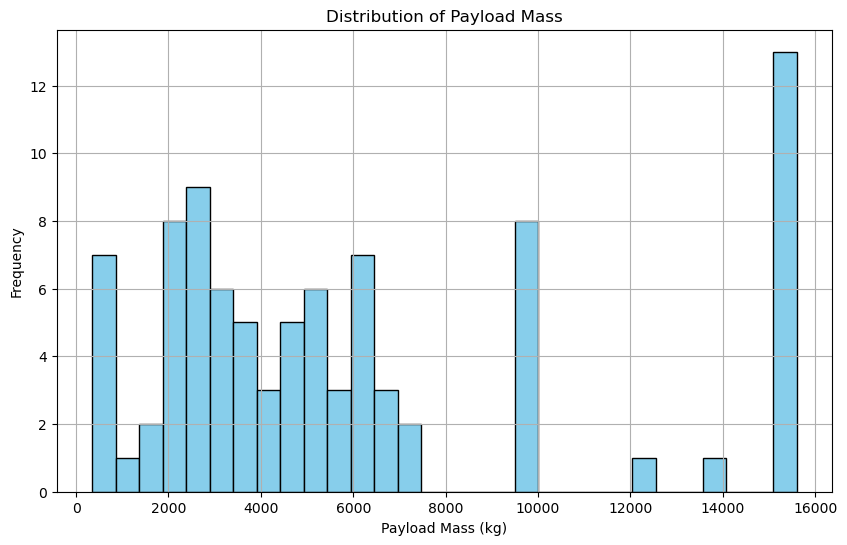

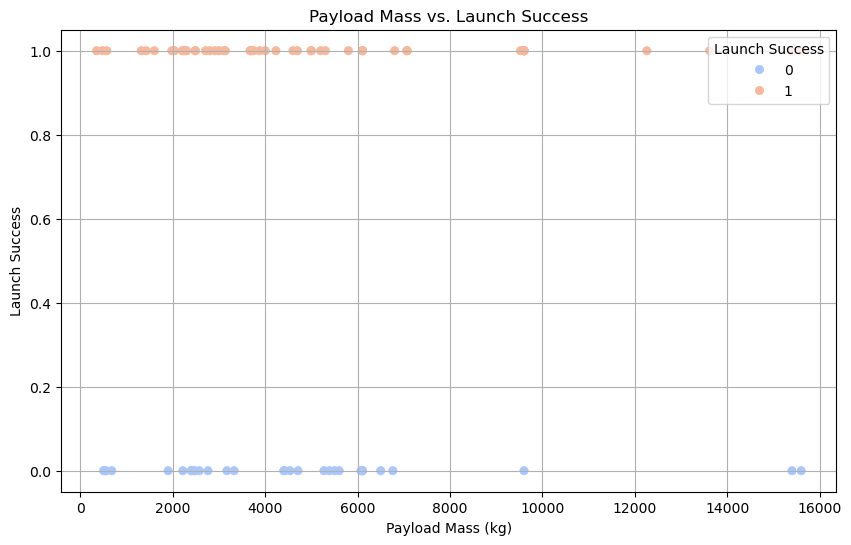

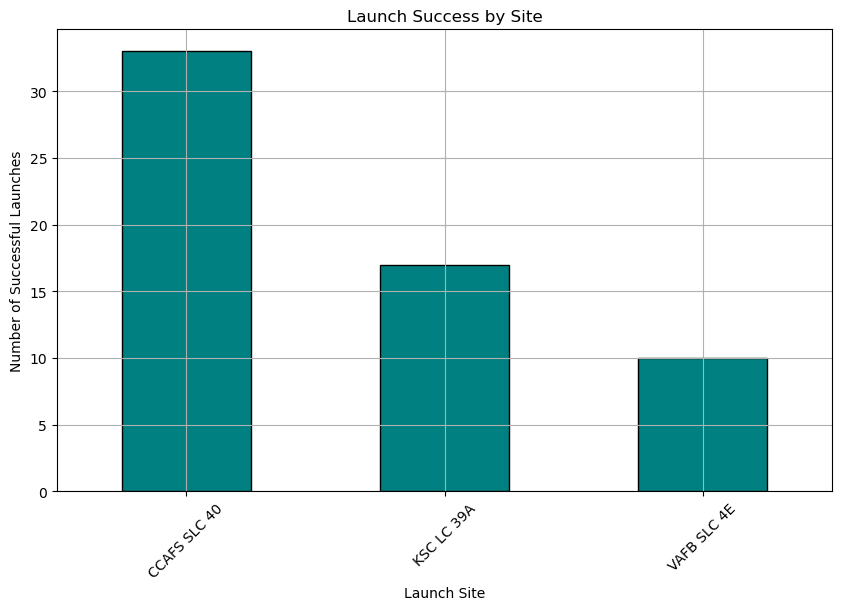

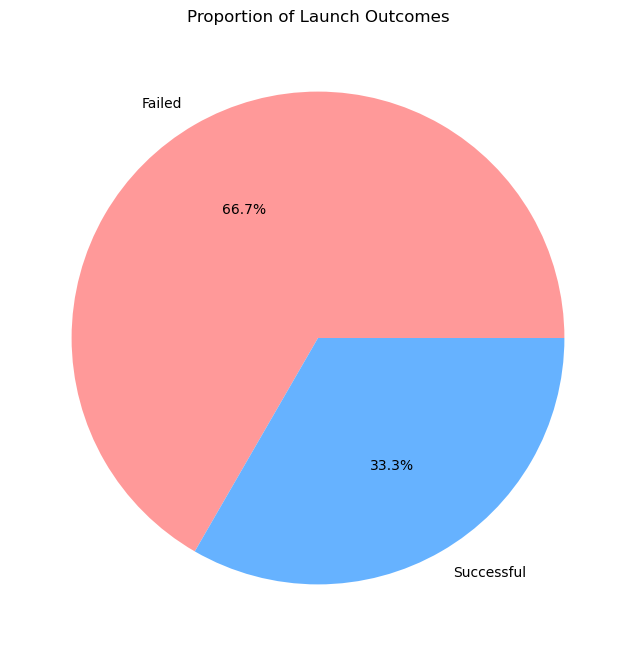

/tmp/ipykernel_10826/1705229436.py:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orbit', y='PayloadMass', data=data, palette='Set2')


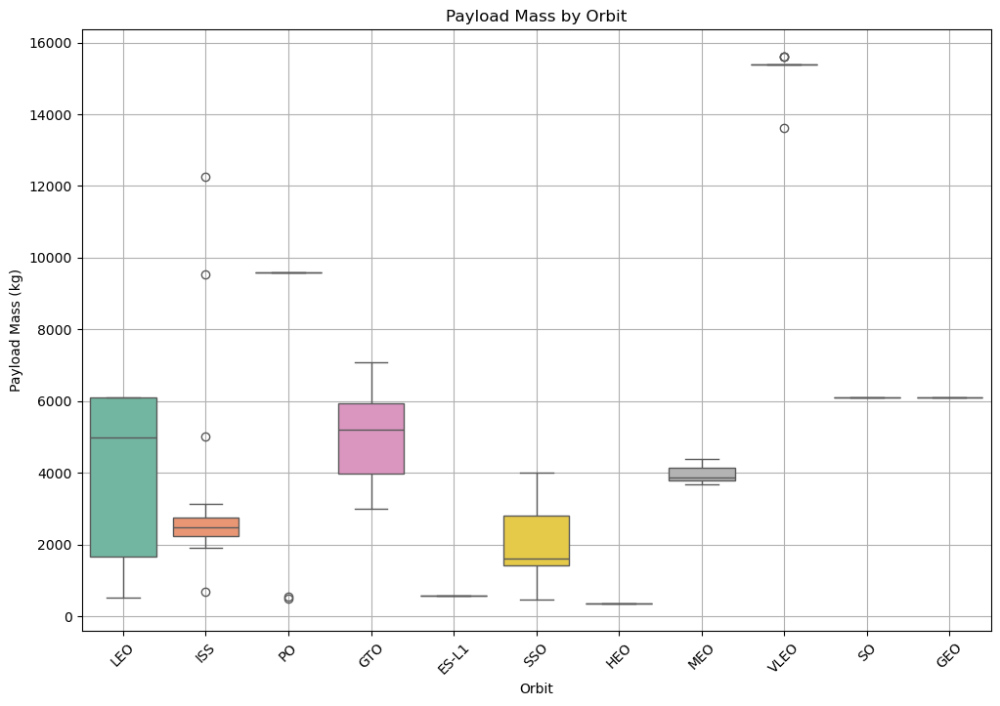

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
data = pd.read_csv('./dataset_part_2.csv')

# 1. Histogram of Payload Mass
plt.figure(figsize=(10, 6))
plt.hist(data['PayloadMass'], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Payload Mass')
plt.xlabel('Payload Mass (kg)')
plt.ylabel('Frequency')
plt.grid(True)
plt.savefig('payload_mass_histogram.png')  # Save the figure
plt.show()

# 2. Scatter Plot of Payload Mass vs. Launch Success
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PayloadMass', y='Class', data=data, hue='Class', palette='coolwarm', edgecolor=None)
plt.title('Payload Mass vs. Launch Success')
plt.xlabel('Payload Mass (kg)')
plt.ylabel('Launch Success')
plt.legend(title='Launch Success', loc='upper right')
plt.grid(True)
plt.savefig('payload_mass_vs_success.png')  # Save the figure
plt.show()

# 3. Bar Chart of Launch Success by Site
launch_site_success = data.groupby('LaunchSite')['Class'].sum()
plt.figure(figsize=(10, 6))
launch_site_success.plot(kind='bar', color='teal', edgecolor='black')
plt.title('Launch Success by Site')
plt.xlabel('Launch Site')
plt.ylabel('Number of Successful Launches')
plt.xticks(rotation=45)
plt.grid(True)
plt.savefig('launch_success_by_site.png')  # Save the figure
plt.show()

# 4. Pie Chart of Launch Outcomes
outcome_counts = data['Class'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(outcome_counts, labels=['Failed', 'Successful'], autopct='%1.1f%%', colors=['#FF9999','#66B2FF'])
plt.title('Proportion of Launch Outcomes')
plt.savefig('launch_outcomes_pie_chart.png')  # Save the figure
plt.show()

# 5. Box Plot of Payload Mass by Orbit
plt.figure(figsize=(12, 8))
sns.boxplot(x='Orbit', y='PayloadMass', data=data, palette='Set2')
plt.title('Payload Mass by Orbit')
plt.xlabel('Orbit')
plt.ylabel('Payload Mass (kg)')
plt.xticks(rotation=45)
plt.grid(True)
plt.savefig('payload_mass_by_orbit.png')  # Save the figure
plt.show()


/tmp/ipykernel_10826/476431646.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Orbit', y='PayloadMass', data=data, palette='Set2', ax=axs[2, 0])
/tmp/ipykernel_10826/476431646.py:45: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[2, 0].set_xticklabels(axs[2, 0].get_xticklabels(), rotation=45)


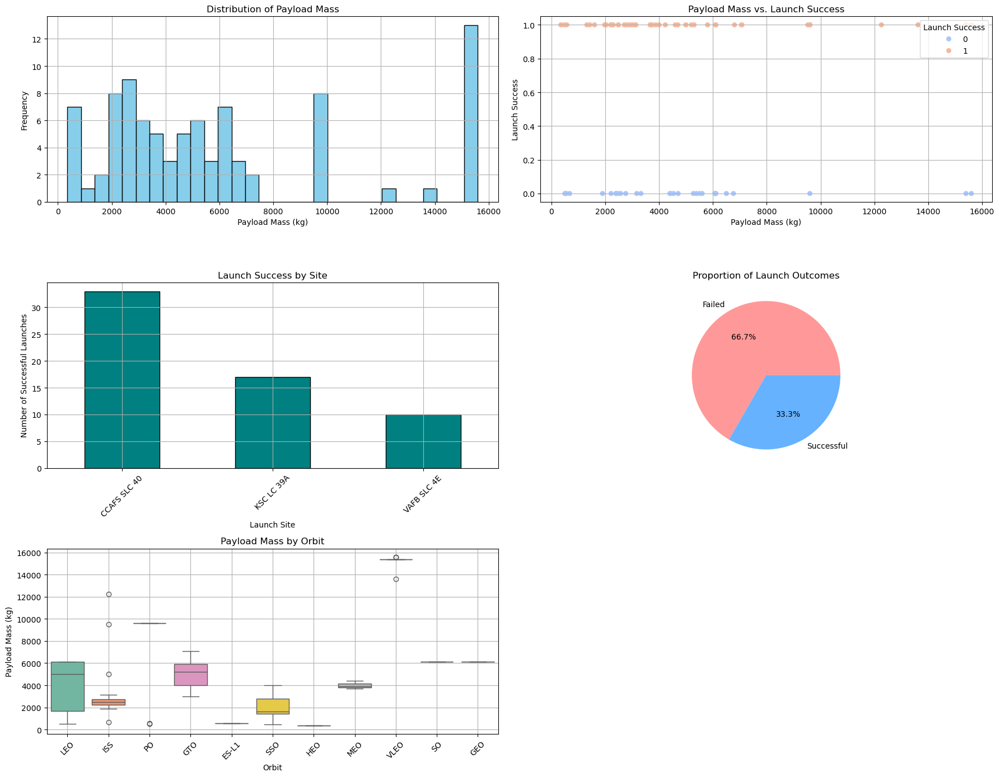

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
data = pd.read_csv('./dataset_part_2.csv')

# Create a figure with subplots
fig, axs = plt.subplots(3, 2, figsize=(18, 14))

# 1. Histogram of Payload Mass
axs[0, 0].hist(data['PayloadMass'], bins=30, color='skyblue', edgecolor='black')
axs[0, 0].set_title('Distribution of Payload Mass')
axs[0, 0].set_xlabel('Payload Mass (kg)')
axs[0, 0].set_ylabel('Frequency')
axs[0, 0].grid(True)

# 2. Scatter Plot of Payload Mass vs. Launch Success
sns.scatterplot(x='PayloadMass', y='Class', data=data, hue='Class', palette='coolwarm', ax=axs[0, 1], edgecolor=None)
axs[0, 1].set_title('Payload Mass vs. Launch Success')
axs[0, 1].set_xlabel('Payload Mass (kg)')
axs[0, 1].set_ylabel('Launch Success')
axs[0, 1].legend(title='Launch Success', loc='upper right')
axs[0, 1].grid(True)

# 3. Bar Chart of Launch Success by Site
launch_site_success = data.groupby('LaunchSite')['Class'].sum()
launch_site_success.plot(kind='bar', color='teal', edgecolor='black', ax=axs[1, 0])
axs[1, 0].set_title('Launch Success by Site')
axs[1, 0].set_xlabel('Launch Site')
axs[1, 0].set_ylabel('Number of Successful Launches')
axs[1, 0].set_xticklabels(launch_site_success.index, rotation=45)
axs[1, 0].grid(True)

# 4. Pie Chart of Launch Outcomes
outcome_counts = data['Class'].value_counts()
axs[1, 1].pie(outcome_counts, labels=['Failed', 'Successful'], autopct='%1.1f%%', colors=['#FF9999','#66B2FF'])
axs[1, 1].set_title('Proportion of Launch Outcomes')

# 5. Box Plot of Payload Mass by Orbit
sns.boxplot(x='Orbit', y='PayloadMass', data=data, palette='Set2', ax=axs[2, 0])
axs[2, 0].set_title('Payload Mass by Orbit')
axs[2, 0].set_xlabel('Orbit')
axs[2, 0].set_ylabel('Payload Mass (kg)')
axs[2, 0].set_xticklabels(axs[2, 0].get_xticklabels(), rotation=45)
axs[2, 0].grid(True)

# Hide the empty subplot (if any)
axs[2, 1].axis('off')

# Adjust layout
plt.tight_layout()

# Save the figure
plt.savefig('combined_eda_plots.png')  # Save the figure as a PNG file
plt.show()


In [38]:
import folium
from folium.plugins import MarkerCluster

# Load data for mapping
launch_sites_df = pd.read_csv('./spacex_launch_geo.csv')
launch_sites_df = launch_sites_df[['Launch Site', 'Lat', 'Long']].drop_duplicates()

# Initialize the map
nasa_coordinate = [29.559684888503615, -95.0830971930759]
site_map = folium.Map(location=nasa_coordinate, zoom_start=5)

# Add circles and markers for each launch site
colors = ['blue', 'green', 'red', 'purple']
for index, row in launch_sites_df.iterrows():
    folium.Circle(
        location=[row['Lat'], row['Long']],
        radius=10000,  # Adjust size if needed
        color=colors[index % len(colors)],
        fill=False,  # No fill
        weight=2
    ).add_to(site_map)
    
    folium.Marker(
        location=[row['Lat'], row['Long']],
        icon=folium.DivIcon(
            icon_size=(20,20),
            icon_anchor=(0,0),
            html=f'<div style="font-size: 12; color:{colors[index % len(colors)]};"><b>{row["Launch Site"]}</b></div>'
        )
    ).add_to(site_map)

# Save and display the map
site_map.save('launch_sites_map.html')
site_map
# For the color-coded outcomes and proximity maps, you would need to add more specific data and logic
# For example, you could add different colors for successful/failed launches and highlight proximities to important features.


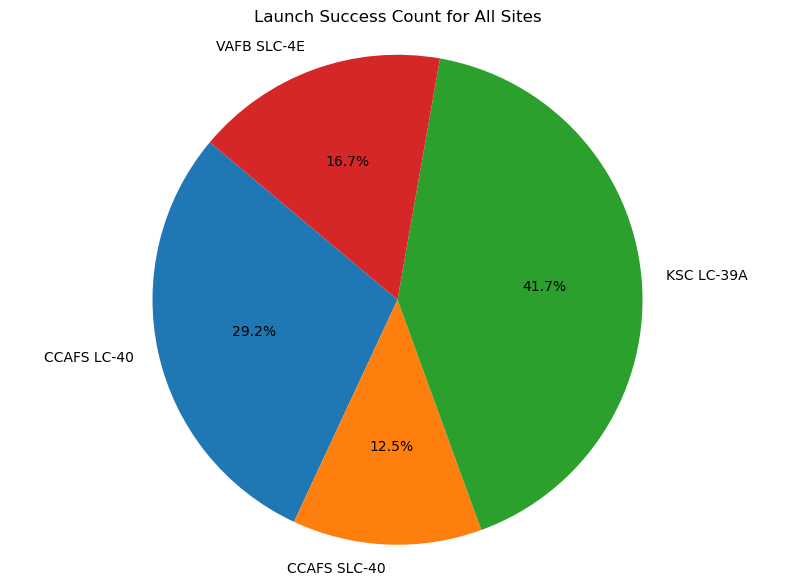

In [39]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data into DataFrame
df = pd.read_csv('spacex_launch_geo.csv')

# Count the number of successful launches for each site
launch_success_count = df[df['class'] == 1].groupby('Launch Site').size()

# Plot the pie chart
plt.figure(figsize=(10, 7))
plt.pie(launch_success_count, labels=launch_success_count.index, autopct='%1.1f%%', startangle=140)
plt.title('Launch Success Count for All Sites')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Show the pie chart
plt.show()


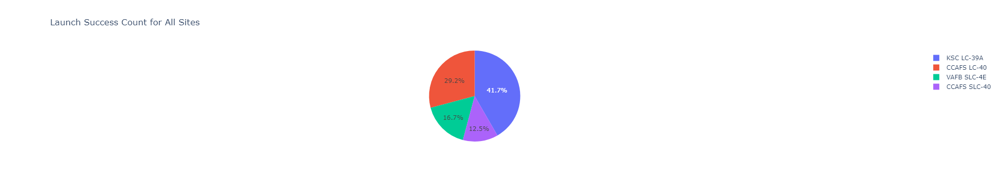

In [40]:
import pandas as pd
import plotly.express as px

# Load data into DataFrame
df = pd.read_csv('spacex_launch_geo.csv')

# Count the number of successful launches for each site
launch_success_count = df[df['class'] == 1].groupby('Launch Site').size().reset_index(name='Count')

# Plot the pie chart
fig = px.pie(launch_success_count, names='Launch Site', values='Count', title='Launch Success Count for All Sites')
fig.show()


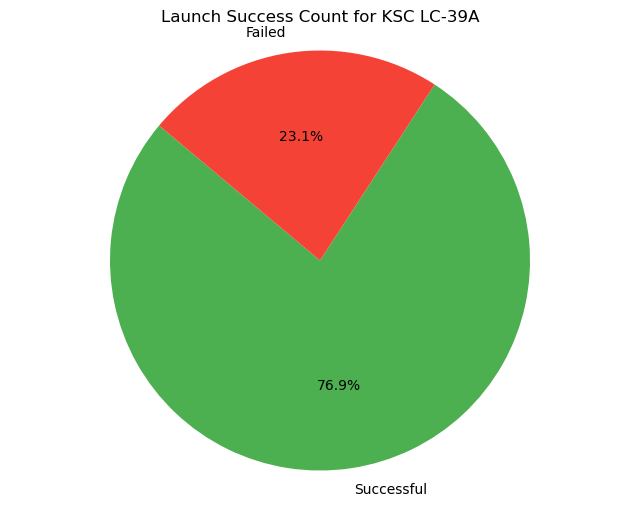

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data into DataFrame
df = pd.read_csv('spacex_launch_geo.csv')

# Calculate total launches and successful launches per site
total_launches = df.groupby('Launch Site').size()
successful_launches = df[df['class'] == 1].groupby('Launch Site').size()

# Calculate success ratios
success_ratios = (successful_launches / total_launches).fillna(0)  # Handle division by zero

# Identify the site with the highest success ratio
top_site = success_ratios.idxmax()
top_site_success_count = successful_launches[top_site] if top_site in successful_launches.index else 0
top_site_total_count = total_launches[top_site] if top_site in total_launches.index else 0

# Create pie chart for the top site
labels = ['Successful', 'Failed']
sizes = [top_site_success_count, top_site_total_count - top_site_success_count]

plt.figure(figsize=(8, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=['#4caf50', '#f44336'])
plt.title(f'Launch Success Count for {top_site}')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()


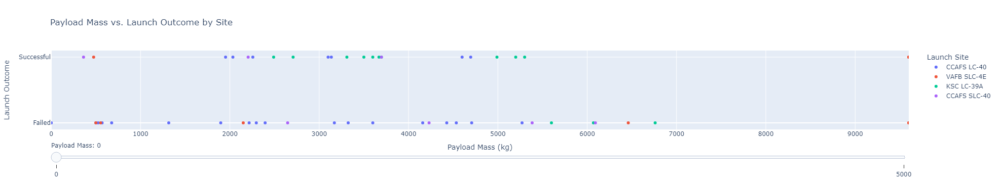

In [2]:
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Load data
df = pd.read_csv('spacex_launch_geo.csv')

# Create scatter plot with Plotly Express
fig = px.scatter(df, x='Payload Mass (kg)', y='class',
                 color='Launch Site',
                 labels={'class': 'Launch Outcome', 'Payload Mass (kg)': 'Payload Mass'},
                 title='Payload Mass vs. Launch Outcome by Site',
                 range_x=[0, df['Payload Mass (kg)'].max()],
                 range_y=[-0.1, 1.1])

# Add range slider
fig.update_layout(
    xaxis=dict(title='Payload Mass (kg)'),
    yaxis=dict(title='Launch Outcome', tickvals=[0, 1], ticktext=['Failed', 'Successful']),
    sliders=[{
        'currentvalue': {'prefix': 'Payload Mass: '},
        'steps': [{'label': str(x), 'method': 'update', 'args': [{'xaxis.range': [x, x+5000]}]} for x in range(0, int(df['Payload Mass (kg)'].max()), 5000)]
    }]
)

# Show the figure
fig.show()


In [6]:
import dash
from dash import dcc, html, Input, Output
import plotly.express as px
import pandas as pd
import dash

# Load data
df = pd.read_csv('spacex_launch_geo.csv')

# Initialize Dash app
app = dash.Dash(__name__)

# Create scatter plot figure
fig = px.scatter(df, x='Payload Mass (kg)', y='class',
                 color='Launch Site',
                 labels={'class': 'Launch Outcome', 'Payload Mass (kg)': 'Payload Mass'},
                 title='Payload Mass vs. Launch Outcome by Site')

# Define app layout
app.layout = html.Div([
    dcc.Graph(id='scatter-plot', figure=fig),
    dcc.RangeSlider(
        id='payload-slider',
        min=0,
        max=df['Payload Mass (kg)'].max(),
        step=100,
        marks={i: str(i) for i in range(0, int(df['Payload Mass (kg)'].max()), 5000)},
        value=[0, df['Payload Mass (kg)'].max()]
    )
])

# Define callback to update graph based on slider
@app.callback(
    Output('scatter-plot', 'figure'),
    [Input('payload-slider', 'value')]
)
def update_graph(payload_range):
    filtered_df = df[(df['Payload Mass (kg)'] >= payload_range[0]) & (df['Payload Mass (kg)'] <= payload_range[1])]
    fig = px.scatter(filtered_df, x='Payload Mass (kg)', y='class',
                     color='Launch Site',
                     labels={'class': 'Launch Outcome', 'Payload Mass (kg)': 'Payload Mass'},
                     title='Payload Mass vs. Launch Outcome by Site')
    return fig

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)


In [7]:
import dash
import dash_core_components as dcc
import dash_html_components as html
import plotly.express as px
import pandas as pd
import numpy as np

# Sample Data
np.random.seed(0)
data = {
    'LaunchSite': np.random.choice(['Site A', 'Site B', 'Site C'], size=100),
    'PayloadMass': np.random.uniform(0, 10000, size=100),
    'LaunchOutcome': np.random.choice(['Success', 'Failure'], size=100)
}
df = pd.DataFrame(data)

# Create a scatter plot
fig = px.scatter(df, x='PayloadMass', y='LaunchOutcome', color='LaunchSite')

# Update figure layout to increase size
fig.update_layout(
    width=1200,  # Width of the figure
    height=600   # Height of the figure
)

# Initialize Dash app
app = dash.Dash(__name__)

app.layout = html.Div([
    dcc.Graph(id='scatter-plot', figure=fig)
])

if __name__ == '__main__':
    app.run_server(debug=True)


/tmp/ipykernel_4546/2569308879.py:2: UserWarning:


The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`

/tmp/ipykernel_4546/2569308879.py:3: UserWarning:


The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`



In [8]:
import dash
import dash_core_components as dcc
import dash_html_components as html
import plotly.express as px
import pandas as pd
import numpy as np

# Sample Data
np.random.seed(0)
data = {
    'LaunchSite': np.random.choice(['Site A', 'Site B', 'Site C'], size=100),
    'PayloadMass': np.random.uniform(0, 10000, size=100),
    'LaunchOutcome': np.random.choice(['Success', 'Failure'], size=100)
}
df = pd.DataFrame(data)

# Create a scatter plot
fig = px.scatter(df, x='PayloadMass', y='LaunchOutcome', color='LaunchSite')

# Update figure layout to increase size
fig.update_layout(
    width=1200,  # Width of the figure
    height=600   # Height of the figure
)

# Initialize Dash app
app = dash.Dash(__name__)

app.layout = html.Div([
    dcc.Graph(id='scatter-plot', figure=fig),
    dcc.RangeSlider(
        id='payload-slider',
        min=df['PayloadMass'].min(),
        max=df['PayloadMass'].max(),
        step=100,
        marks={i: str(i) for i in range(0, int(df['PayloadMass'].max()), 1000)},
        value=[df['PayloadMass'].min(), df['PayloadMass'].max()]
    )
])

if __name__ == '__main__':
    app.run_server(debug=True)


In [9]:
import dash
from dash import dcc, html, Input, Output
import plotly.express as px
import pandas as pd

# Load data
df = pd.read_csv('spacex_launch_geo.csv')

# Initialize Dash app
app = dash.Dash(__name__)

# Create scatter plot figure
fig = px.scatter(df, x='Payload Mass (kg)', y='class',
                 color='Launch Site',
                 labels={'class': 'Launch Outcome', 'Payload Mass (kg)': 'Payload Mass'},
                 title='Payload Mass vs. Launch Outcome by Site')

# Update figure layout to increase size
fig.update_layout(
    width=1200,  # Width of the figure
    height=600,  # Height of the figure
)

# Define app layout
app.layout = html.Div([
    dcc.Graph(id='scatter-plot', figure=fig),
    dcc.RangeSlider(
        id='payload-slider',
        min=0,
        max=df['Payload Mass (kg)'].max(),
        step=100,
        marks={i: str(i) for i in range(0, int(df['Payload Mass (kg)'].max()), 5000)},
        value=[0, df['Payload Mass (kg)'].max()],
        tooltip={"placement": "bottom", "always_visible": True}
    )
])

# Define callback to update graph based on slider
@app.callback(
    Output('scatter-plot', 'figure'),
    [Input('payload-slider', 'value')]
)
def update_graph(payload_range):
    filtered_df = df[(df['Payload Mass (kg)'] >= payload_range[0]) & (df['Payload Mass (kg)'] <= payload_range[1])]
    fig = px.scatter(filtered_df, x='Payload Mass (kg)', y='class',
                     color='Launch Site',
                     labels={'class': 'Launch Outcome', 'Payload Mass (kg)': 'Payload Mass'},
                     title='Payload Mass vs. Launch Outcome by Site')
    fig.update_layout(
        width=1200,  # Width of the figure
        height=600,  # Height of the figure
    )
    return fig

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)


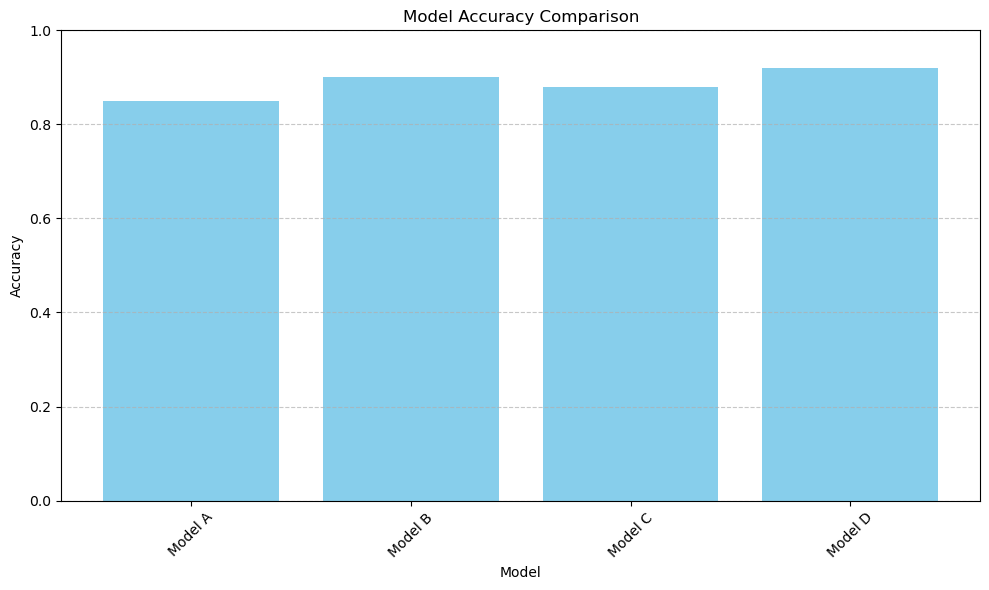

Model with the highest accuracy: Model D with an accuracy of 0.92


In [10]:
import matplotlib.pyplot as plt
import pandas as pd

# Sample data: Replace with your model names and accuracy values
model_accuracies = {
    'Model A': 0.85,
    'Model B': 0.90,
    'Model C': 0.88,
    'Model D': 0.92
}

# Create a DataFrame from the model accuracies
df_accuracies = pd.DataFrame(list(model_accuracies.items()), columns=['Model', 'Accuracy'])

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(df_accuracies['Model'], df_accuracies['Accuracy'], color='skyblue')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Model Accuracy Comparison')
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Show the plot
plt.show()

# Find the model with the highest accuracy
best_model = df_accuracies.loc[df_accuracies['Accuracy'].idxmax()]
print(f"Model with the highest accuracy: {best_model['Model']} with an accuracy of {best_model['Accuracy']:.2f}")


<Figure size 800x600 with 0 Axes>

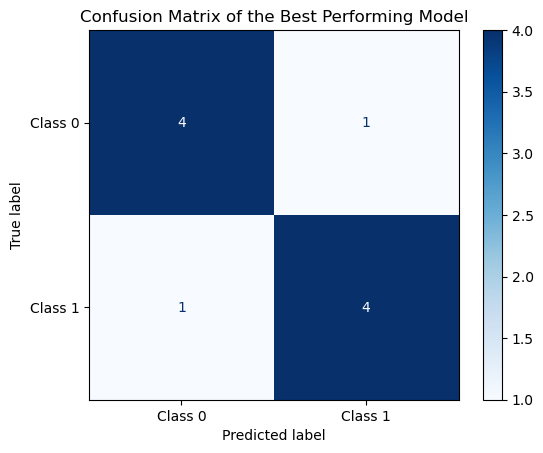

Confusion Matrix:
[[4 1]
 [1 4]]


In [11]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Sample data: Replace these with your actual predictions and true labels
y_true = np.array([0, 1, 0, 1, 0, 1, 1, 0, 0, 1])  # True labels
y_pred = np.array([0, 1, 0, 0, 0, 1, 1, 1, 0, 1])  # Predicted labels

# Generate confusion matrix
cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Class 0', 'Class 1'])

# Plot confusion matrix
plt.figure(figsize=(8, 6))
disp.plot(cmap=plt.cm.Blues, values_format='d')
plt.title('Confusion Matrix of the Best Performing Model')
plt.show()

# Print confusion matrix
print("Confusion Matrix:")
print(cm)


/tmp/ipykernel_4546/3951996271.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




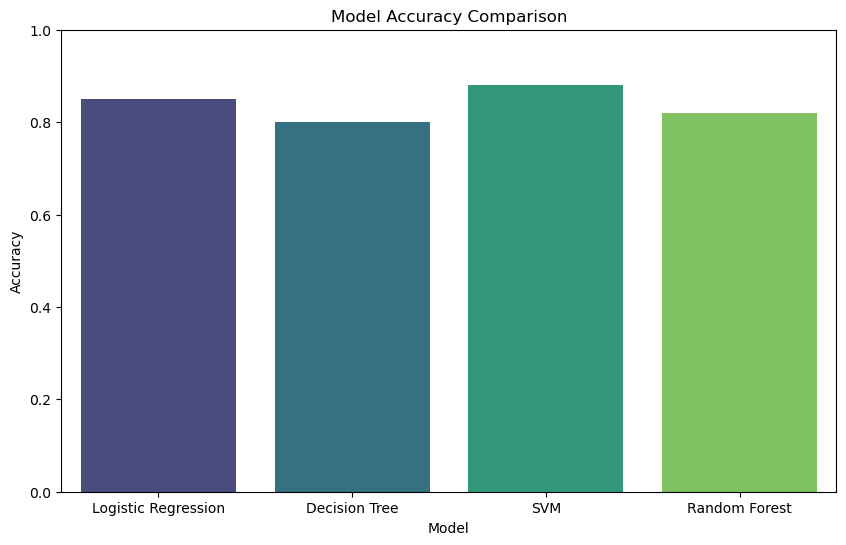

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Example model accuracies
model_accuracies = {
    'Logistic Regression': 0.85,
    'Decision Tree': 0.80,
    'SVM': 0.88,
    'Random Forest': 0.82
}

# Convert to DataFrame
accuracy_df = pd.DataFrame(list(model_accuracies.items()), columns=['Model', 'Accuracy'])

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Model', y='Accuracy', data=accuracy_df, palette='viridis')
plt.title('Model Accuracy Comparison')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
plt.show()


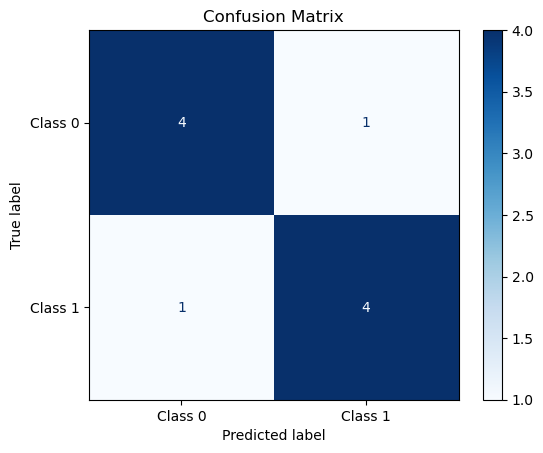

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Example true labels and predictions
y_true = [0, 1, 0, 1, 0, 0, 1, 1, 0, 1]  # Replace with actual labels
y_pred = [0, 1, 0, 1, 0, 1, 1, 0, 0, 1]  # Replace with actual predictions

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Class 0', 'Class 1'])
disp.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
D